# Описание проекта

Необходимо подготовить исследование рынка Москвы для инвесторов из фонда «Shut Up and Take My Money», которые решили попробовать себя в новой области и открыть заведение общественного питания в Москве. 

Для исследования будет использован датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес.

Для начала будут изучены данные и предобработаны, будут удалены пропуски и дубликаты, если это будут возможно. Затем будет проведен анализ данных: исследованы категории заведений, количество посадочных мест, расположение в округах и на улицах, выведем рейтинги заведений и средние чеки.

Далее для инвесторов отдельно будет исследован рунок кофеен Москвы, так как это приоритетное нарпавление для их инвестиций.

В завершение проекта будет подготовлена презентация с основными выводами на основании исследования.

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import json
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster
import plotly.express as px

# Шаг 1. Загрузите данные и изучите общую информацию

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
data.info() # получим общую информацию о датафрейме и типах данных в нем

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
data.head() # получим названия столбцов датафрейма

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
data.isnull().sum() 
# проверил наличие пропусков в датафрейме

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

В датафрейме пропуски есть в следующих столбцах: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. Пропусков слишком много и если их удалить, то можно сильно исказить данные.

# Шаг 2. Выполните предобработку данных

In [6]:
def name_street(address):
    parts = address.split(',')
    street = parts[1].strip()
    return street

data['street'] = data['address'].apply(name_street)
data.head() # добавил столбец с названиями улиц

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


In [7]:
data['is_24_7'] = data['hours'].apply(lambda x: True if x == 'ежедневно, круглосуточно' else False)
data.head() # добавил столбец с круглосуточным режимом работы

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [8]:
data.duplicated().sum() # 0 дубликатов

0

In [9]:
data.name = data['name'].str.lower()
data.address = data['address'].str.lower()
# заменю прописные буквы на строчные

In [10]:
data['name'] = data['name'].str.replace('ё', 'е', regex=True) # заменю букву ё в названиях на букву е

In [11]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [12]:
data['name'].duplicated().sum()

2900

In [13]:
duplicates = data[data.duplicated(subset=['name', 'address'], keep=False)]
display(duplicates)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN,парк Ангарские Пруды,False
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN,парк Ангарские пруды,False
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0,Волоколамское шоссе,False
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,Волоколамское шоссе,False
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0,проспект Мира,False
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0,проспект Мира,False
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0,Ярцевская улица,False
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0,Ярцевская улица,False


Обнаружено 4 неявных дубликата.

In [14]:
delete_duplicates = data.drop_duplicates(subset=['name', 'address'])
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
 14  street             8406 non-null   object 
 15  is_24_7            8406 non-null   bool   
dtypes: bool(1), float64(6), 

# Шаг 3. Анализ данных

In [15]:
data['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [16]:
fig = px.bar(data['category'].value_counts(), x='category', title='Количество по категориям', color_discrete_sequence=['brown'])

fig.update_layout(
    xaxis_title='Категория',
    yaxis_title='Количество'
)

fig.show()

Больше всего заведений в категориях "Кафе" и "Ресторан", меньше всего - "Столовая", "Булочная"

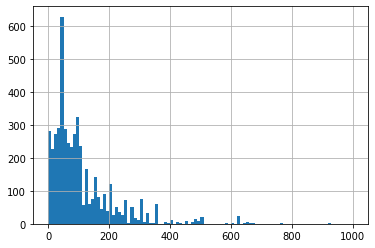

In [17]:
data['seats'].hist(range=(0, 1000), bins = 100); #больше 600 заведений имеет количество посадочных мест примерно 50, аномальные значения начинаются с 400, возможно это банкетные залы, заведений свыше 200 мест тоже не много.

In [18]:
seats_amount = data.groupby('category')['seats'].median().reset_index()
seats_amount = seats_amount.sort_values(by='seats', ascending=False)

fig = px.bar(seats_amount, x='category', y='seats', title='Среднее количество посадочных мест по категориям', color_discrete_sequence=['brown'])

fig.update_layout(
    xaxis_title='Категория',
    yaxis_title='Количество мест'
)

fig.update_xaxes(tickangle=45)
fig.show()

In [19]:
chain_yes = data[data['chain'] == 1]['chain'].count()
print('Количество сетевых заведений: ', chain_yes)
chain_no = data[data['chain'] == 0]['chain'].count()
print('Количество несетевых заведений: ', chain_no)

# больше несетевых заведений.

Количество сетевых заведений:  3205
Количество несетевых заведений:  5201


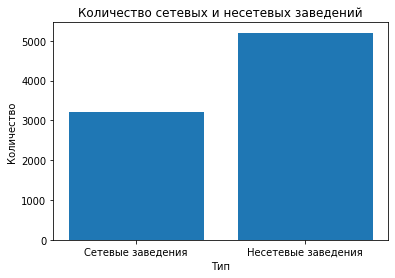

In [20]:
labels = ['Сетевые заведения', 'Несетевые заведения']
counts = [chain_yes, chain_no]

plt.bar(labels, counts)
plt.title('Количество сетевых и несетевых заведений')
plt.xlabel('Тип')
plt.ylabel('Количество')

plt.show()

In [21]:
total_chain_category = data.groupby('category').size().reset_index(name='count')
chain_yes = data[data['chain'] == 1]
chain_yes_count = chain_yes.groupby('category').size().reset_index(name='count')
chain_yes_count = chain_yes_count.sort_values(by='count', ascending=False)
total_chain_category_share = chain_yes_count.merge(total_chain_category, on='category', suffixes=('_yes', '_total'))
total_chain_category_share['share'] = total_chain_category_share['count_yes'] / total_chain_category_share['count_total'] * 100
fig = px.bar(total_chain_category_share, x='category', y='share', title='Доля сетевых заведений по категориям', color_discrete_sequence=['brown'])

fig.update_layout(
    xaxis_title='Категория',
    yaxis_title='Доля в категории'
)

fig.update_xaxes(tickangle=45)
fig.show()



Чаще всего сетевыми заведениями являются - кафе, рестораны и кофейни.

In [22]:
chain_yes_top_15 = chain_yes.groupby(['name', 'category']).size().reset_index(name='total_top')

chain_yes_top_15 = chain_yes_top_15.sort_values(by=['total_top', 'name', 'category'], ascending=[False, False, False])

chain_yes_top_15 = chain_yes_top_15.head(15)

chain_yes_top_15_styled = chain_yes_top_15.style.background_gradient(cmap=sns.light_palette("brown", as_cmap=True))

chain_yes_top_15_styled

,name,category,total_top
1128,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1144,яндекс лавка,ресторан,69
72,cofix,кофейня,65
241,prime,ресторан,49
620,кофепорт,кофейня,42
635,кулинарная лавка братьев караваевых,кафе,39
965,теремок,ресторан,36


Среди заведений лидирует Шоколадница - 119 заведений, далее пиццерии с доставкой Доминос и ДоДо - 76 и 74 соответственно. Ниже располагаются кофейни с фиксированными ценами и доставка еды - Яндекс лавка.

In [23]:
district_amount = data['district'].value_counts()
print(district_amount)

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64


In [24]:
district_grouped = data.groupby('district')['category'].nunique()
district_pivot = data.pivot_table(
    index='district', 
    columns='category', 
    aggfunc='size', 
    fill_value=0
)
district_pivot['total'] = district_pivot.sum(axis=1)

display(district_pivot.sort_values(by=['total'], ascending=[False]))

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Северный административный округ,68,39,58,235,193,77,189,41,900
Южный административный округ,68,25,85,264,131,73,202,44,892
Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
Западный административный округ,50,37,62,239,150,71,218,24,851
Восточный административный округ,53,25,71,272,105,72,160,40,798
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


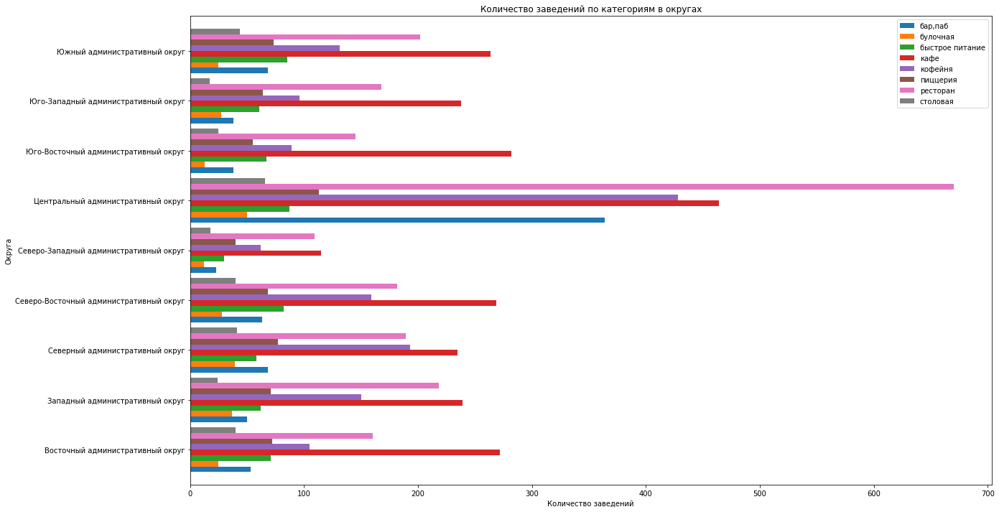

In [25]:
district_pivot = data.pivot_table(
    index='district', 
    columns='category', 
    aggfunc='size',
    fill_value=0
)

district_pivot.plot(kind='barh', figsize=(20, 12), width=0.9)
plt.title('Количество заведений по категориям в округах')
plt.xlabel('Количество заведений')
plt.ylabel('Округа')
plt.legend()
plt.show();

Больше всего заведений сосредоточено в ЦАО - рестораны, кафе, кофейни. Далее САО, ЮАО, СВАО и ЗАО - примерно по 800-900 заведений, формат кафе преобладает. Меньше всего заведений в СЗАО - чуть больше 400. 

In [26]:
rating_grouped = data.groupby('category')['rating'].mean()
rating_grouped_sort = rating_grouped.sort_values(ascending=False)
# Группировка по среднему значению рейтинга в категории

# Подсчет количества отзывов для каждой категории
rating_count = data.groupby('category').size()

# Объединение средних значений рейтинга и количества отзывов
result = pd.DataFrame({
    'Средний рейтинг': rating_grouped_sort,
    'Количество отзывов': rating_count
})
result_sort = result.sort_values(by='Средний рейтинг', ascending=False)
print(result_sort)

                 Средний рейтинг  Количество отзывов
category                                            
бар,паб                 4.387712                 765
пиццерия                4.301264                 633
ресторан                4.290357                2043
кофейня                 4.277282                1413
булочная                4.268359                 256
столовая                4.211429                 315
кафе                    4.123886                2378
быстрое питание         4.050249                 603


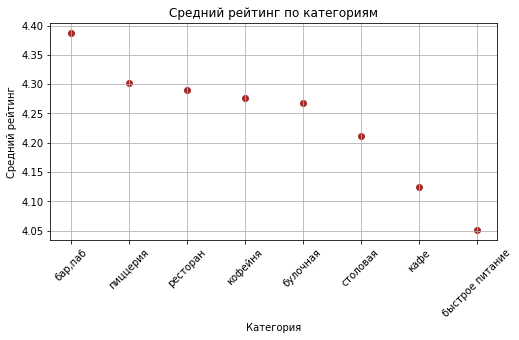

In [27]:
plt.figure(figsize=(8, 4))
plt.scatter(rating_grouped_sort.index, rating_grouped_sort.values, color='brown')
plt.title('Средний рейтинг по категориям')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation=45)  # Поворот меток по оси X для лучшей читаемости
plt.grid(True)
plt.show()

Во всех категориях рейтинг отличается незначительно, хуже всего обстоят дела у быстрого питания и кафе, в лидерах - бар,паб.

In [28]:
data['district'].unique()

rating_data = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_data

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [29]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

В ЦАО самый высокий средний рейтинг у заведений.

In [30]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

In [31]:
street_top = data.groupby(['street']).size().reset_index(name='food_count')
street_top = street_top.sort_values(by=['food_count', 'street'], ascending=[False, False])
print(street_top.head(15))

                      street  food_count
1090           проспект Мира         184
773        Профсоюзная улица         122
1087    проспект Вернадского         108
525       Ленинский проспект         107
523   Ленинградский проспект          95
373        Дмитровское шоссе          88
455          Каширское шоссе          77
298         Варшавское шоссе          76
524      Ленинградское шоссе          70
550                     МКАД          65
547         Люблинская улица          60
1154          улица Вавилова          55
517     Кутузовский проспект          54
1309    улица Миклухо-Маклая          49
781          Пятницкая улица          48


In [32]:
top_streets = data['street'].value_counts().head(15)

fig = px.bar(top_streets, x=top_streets.index, y=top_streets.values, title='Количество заведений на Топ-15 улицах', color_discrete_sequence=['brown'])

fig.update_layout(
    xaxis_title='Улица',
    yaxis_title='Количество заведений'
)

fig.show()

In [33]:
street_top_15 = data.groupby(['street', 'category']).size().reset_index(name='food_count')

street_top_15 = street_top_15.sort_values(by=['food_count', 'street', 'category'], ascending=[False, False, False])

#street_top_15 = street_top_15.head(15)

street_top_15_styled = street_top_15.style.background_gradient(cmap=sns.light_palette("brown", as_cmap=True))

street_top_15_styled

,street,category,food_count
2860,проспект Мира,кафе,53
2863,проспект Мира,ресторан,45
1380,МКАД,кафе,45
2861,проспект Мира,кофейня,36
1989,Профсоюзная улица,кафе,35
2848,проспект Вернадского,ресторан,33
1295,Ленинский проспект,ресторан,33
1992,Профсоюзная улица,ресторан,26
1363,Люблинская улица,кафе,26
1292,Ленинский проспект,кафе,26


In [34]:
top_streets = street_top_15['street'].value_counts().head(15).index
street_top_15 = street_top_15[street_top_15['street'].isin(top_streets)]

fig = px.bar(street_top_15, 
             y='street', 
             x= 'food_count',
             template = 'ggplot2',
             color='category', barmode='stack',
             title = 'Количество заведений по категориям на Топ-15 улицах', 
)
fig.update_layout(yaxis_title = 'Улица, категория заведения',
                  xaxis_title = 'Количество заведений')

fig.show()

Больше всего заведений расположено на проспекте Мира, из категорий преобладают кафе - 53, рестораны - 45 и кофейни - 36.

In [35]:
street_amount_1 = data.groupby(['street']).size().reset_index(name='food_count')

street_amount_1 = street_amount_1.sort_values(by=['food_count', 'street'], ascending=[False, False])

street_amount_1 = street_amount_1[street_amount_1['food_count'] == 1]

print('Количество улиц с 1 заведением: ', street_amount_1.count())

street_amount_1_styled = street_amount_1.style.background_gradient(cmap=sns.light_palette("blue", as_cmap=True))

street_amount_1_styled

Количество улиц с 1 заведением:  street        458
food_count    458
dtype: int64


,street,food_count
1447,№ 7,1
1442,улица Юннатов,1
1439,улица Шухова,1
1437,улица Шкулёва 4,1
1436,улица Шкулёва,1
1433,улица Чистова,1
1432,улица Чечулина,1
1421,улица Фотиевой,1
1418,улица Фадеева,1
1416,улица Уткина,1


In [36]:
one_amount_on_street =  street_amount_1.street.tolist()
one_amount_data = data.query('street in @one_amount_on_street')
display(one_amount_data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False


In [37]:
one_amount_data['category'].value_counts()

кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

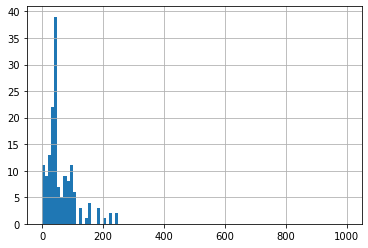

In [38]:
one_amount_data['seats'].hist(range=(0, 1000), bins = 100);

In [39]:
one_amount_data['district'].value_counts()

Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64

In [40]:
one_rating_grouped = one_amount_data.groupby('category')['rating'].mean()
one_rating_grouped_sort = one_rating_grouped.sort_values(ascending=False)
# Группировка по среднему значению рейтинга в категории

# Подсчет количества отзывов для каждой категории
one_rating_count = one_amount_data.groupby('category').size()

# Объединение средних значений рейтинга и количества отзывов
one_result = pd.DataFrame({
    'Средний рейтинг': one_rating_grouped_sort,
    'Количество отзывов': one_rating_count
})
one_result_sort = one_result.sort_values(by='Средний рейтинг', ascending=False)
print(one_result_sort)

                 Средний рейтинг  Количество отзывов
category                                            
бар,паб                 4.479487                  39
пиццерия                4.373333                  15
булочная                4.337500                   8
кофейня                 4.307143                  84
столовая                4.261111                  36
ресторан                4.246237                  93
кафе                    4.133750                 160
быстрое питание         4.082609                  23


In [41]:
one_district_grouped = one_amount_data.groupby('district')['category'].nunique()
one_district_pivot = one_amount_data.pivot_table(
    index='district', 
    columns='category', 
    aggfunc='size', 
    fill_value=0
)
one_district_pivot['total'] = one_district_pivot.sum(axis=1)

display(one_district_pivot.sort_values(by=['total'], ascending=[False]))

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Центральный административный округ,23,2,3,38,34,2,36,7,145
Северо-Восточный административный округ,2,0,3,16,10,3,14,7,55
Восточный административный округ,2,0,7,18,7,6,7,5,52
Северный административный округ,2,2,1,20,13,1,7,6,52
Южный административный округ,0,1,2,22,5,0,8,5,43
Юго-Восточный административный округ,5,0,1,20,6,1,4,2,39
Западный административный округ,4,2,3,13,2,2,8,1,35
Северо-Западный административный округ,1,0,1,4,3,0,8,2,19
Юго-Западный административный округ,0,1,2,9,4,0,1,1,18


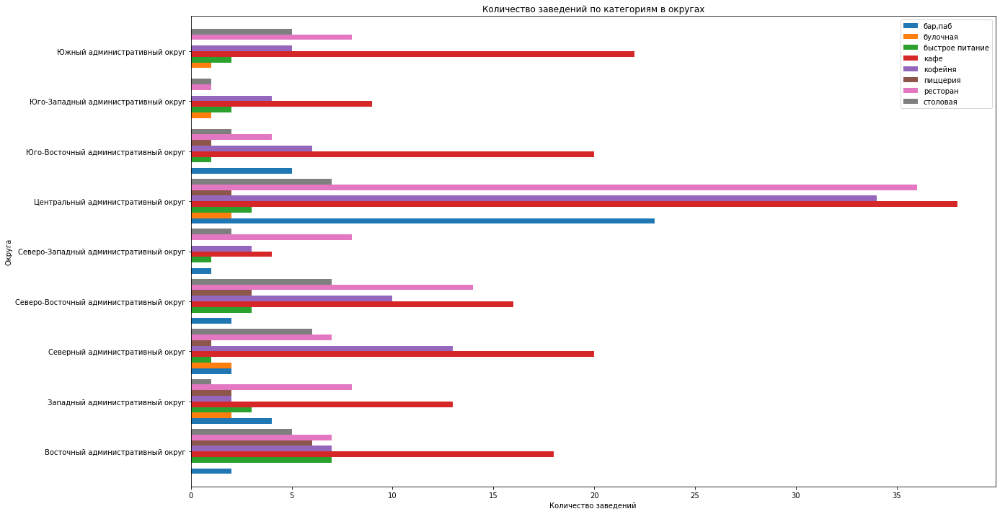

In [42]:
one_district_pivot = one_amount_data.pivot_table(
    index='district', 
    columns='category', 
    aggfunc='size',
    fill_value=0
)

one_district_pivot.plot(kind='barh', figsize=(20, 12), width=0.9)
plt.title('Количество заведений по категориям в округах')
plt.xlabel('Количество заведений')
plt.ylabel('Округа')
plt.legend()
plt.show();

Больше всего одиноких заведений находится в ЦАО, меньше всего в ЮЗАО и СЗАО. Самые популярные категории - кафе, далее следуют рестораны и кофейни. Одинокие заведения имеют рейтинг чуть выше, возможно они действительно стараются для посетитлей, а возможно отзывы накручены.

In [43]:
district_avg_bill = data.groupby('district')['middle_avg_bill'].median()
display(district_avg_bill.sort_values(ascending=False))

district
Западный административный округ            1000.0
Центральный административный округ         1000.0
Северо-Западный административный округ      700.0
Северный административный округ             650.0
Юго-Западный административный округ         600.0
Восточный административный округ            575.0
Северо-Восточный административный округ     500.0
Южный административный округ                500.0
Юго-Восточный административный округ        450.0
Name: middle_avg_bill, dtype: float64

In [44]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=district_avg_bill,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)
m

Самые высокие средние чеки в ЦАО и ЗАО, что говорит о том, что именно эти районы посещают и/или живут обеспеченные люди.

Вывод: 
Больше всего заведений в категориях "Кафе" и "Ресторан", меньше всего в категориях - "Столовая", "Булочная". Количество сетевых заведений - 3205, несетевых заведений - 5201, чаще всего сетевыми заведениями являются - кафе, рестораны и кофейни. Среди заведений лидирует Шоколадница - 119 заведений, далее пиццерии с доставкой Доминос и ДоДоПицца - 76 и 74 соответственно. Ниже располагаются кофейни с фиксированными ценами и доставка еды - Яндекс лавка. 

Больше всего заведений сосредоточено в ЦАО - рестораны, кафе, кофейни. Далее САО, ЮАО, СВАО и ЗАО - примерно по 800-900 заведений, формат кафе преобладает. Меньше всего заведений в СЗАО - чуть больше 400. Во всех категориях рейтинг отличается незначительно, хуже всего обстоят дела у быстрого питания и кафе, в лидерах - бар,паб. В ЦАО самый высокий средний рейтинг у заведений. 

Больше всего заведений расположено на проспекте Мира, из категорий преобладают кафе - 53, рестораны - 45 и кофейни - 36. Больше всего одиноких заведений находится в ЦАО, меньше всего в ЮЗАО и СЗАО. Самые популярные категории - кафе, далее следуют рестораны и кофейни. Одинокие заведения имеют рейтинг чуть выше, возможно они действительно стараются для посетитлей, а возможно отзывы накручены.

# Шаг 4. Детализируем исследование: открытие кофейни

In [45]:
coffee = data[data['category'] == 'кофейня']
coffee_counts = coffee['category'].value_counts()
print(coffee_counts)
# вычислил общее количество кофеен

кофейня    1413
Name: category, dtype: int64


In [46]:
data_coffee = coffee.index.tolist()
data_coffee_common = data[data.index.isin(data_coffee)]
display(data_coffee_common.head())
# подготовил отдельный датасет для кофеен

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False


In [47]:
chain_yes_coffee = data_coffee_common[data_coffee_common['chain'] == 1]['chain'].count()
print('Количество сетевых кофеен: ', chain_yes_coffee)
chain_no_coffee = data_coffee_common[data_coffee_common['chain'] == 0]['chain'].count()
print('Количество несетевых кофеен: ', chain_no_coffee)

Количество сетевых кофеен:  720
Количество несетевых кофеен:  693


In [48]:
data_coffee_common['is_24_7'].value_counts()

False    1354
True       59
Name: is_24_7, dtype: int64

In [49]:
district_amount_coffee = data_coffee_common['district'].value_counts()
print(district_amount_coffee)

Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: district, dtype: int64


In [50]:
rating_grouped_coffee = data_coffee_common.groupby('category')['rating'].mean()
rating_grouped_coffee_sort = rating_grouped_coffee.sort_values(ascending=False)
# Группировка по среднему значению рейтинга в категории


# Объединение средних значений рейтинга и количества отзывов
result_coffee = pd.DataFrame({
    'Средний рейтинг': rating_grouped_coffee_sort
})
result_coffee_sort = result_coffee.sort_values(by='Средний рейтинг', ascending=False)
print(result_coffee_sort)

          Средний рейтинг
category                 
кофейня          4.277282


In [51]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_coffee_common,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

In [52]:
price_cup = data_coffee_common[data_coffee_common['middle_coffee_cup'].notna()]
print('Медианное значение стоимости чашки кофе: ', price_cup['middle_coffee_cup'].median())

Медианное значение стоимости чашки кофе:  170.0


In [53]:
price_cup = data_coffee_common[data_coffee_common['middle_coffee_cup'].notna()]
print(price_cup['middle_coffee_cup'].describe())

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64


In [54]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=price_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медианная стоимость чашки кофе по районам',
).add_to(m)

# выводим карту
m

Вывод: 

Всего 1413 кофеен, из них только 59 круглосуточных, сетевые и несетевые кофейни распределены примерно одинаково. Больше всего кофеен в ЦАО, САО и СВАО. Высокие рейтинги у кофеен, расположенных в САО и СВАО, самые высокие цены за чашку кофе в ЦАО, СВАО.

У нас мало данных, так как много пропусков в столбцах, было бы хорошо заполнить эти пропуски.

Исходя из имеющихся данных можно рекомендовать следующее: для открытия стоит рассматривать районы более низкой концентрацией кофеен, чем в ЦАО. В САО И СВАО кофейни имеют высокие рейтинги и достаточно высокие цены на чашку кофе, но следует понять из чего складываются высокие рейтинги, эта ситуация у всех заведений или только у исключений, если высокие рейтинги имееют уникальные кофейни, то вполне можно побороться за рынок в этих Округах.

Рекомендация: Меньше всего конкуренция в ЮВАО, ЗАО, ЮЗАО, СЗАО, ВАО, СВАО, ЮАО поэтому эти округа потенциально интересные для открытия кофейни, но цены на чашку кофе в этих районах ниже чем в ЦАО и СВАО, следует просчитать маржинальность. Кроме того, рейтинги в этих округах низкие, что может говорить о низком уровне сервиса или продукта, следует исследовать отзывы, и учесть при открытии кофейни, таким образом можно зарекомендовать себя с положительной стороны среди потребителей. Ключевые критерии успешности кофейни - высокий рейтинг, доступная цена на чашку кофе, ниже 170 руб., но необходимо учитывать объем, локация - округ с низкой конкуренцией, ЦАО исключаем. 

Презентация: <https://disk.yandex.ru/i/7ikUQMzpWT3blg>